# Mapping GPX File Data with Python and Mapbox

## Import modules

In [10]:
import plotly.express as px
import numpy as np
import pandas as pd
from gpx_converter import Converter

## Convert local GPX file to Dataframe

In [ ]:
import xml.etree.ElementTree as ET
import requests
import json

# Initialise variables
speedValue=list()
postcode=list()
region=list()
# Parse gpx
tree = ET.parse('/Users/sri/dfi_project/map-gpx-with-plotly/tom_s.gpx')
root = tree.getroot()

for value in root.iter('{http://www.topografix.com/GPX/1/0}speed'):
    speedValueUpdated=speedValue.append(value.text + " km/h")
df = Converter(input_file='/Users/sri/dfi_project/map-gpx-with-plotly/tom_s.gpx').gpx_to_dataframe()
df['speed']=speedValue
df1=df

# Iterate through the dataframe to get postcode of each latitude and longitude
for index, row in df1.iterrows():
    urlForEachCoordinate ='http://api.postcodes.io/postcodes?lon='+ str(row['longitude']) + '&lat=' + str(row['latitude'])
#     print(url)
    responseBody = requests.get(urlForEachCoordinate)
    resultBody = responseBody.json()
    
    if str((resultBody)["result"]) != 'None':
    
        print(resultBody["result"][0]['postcode'])
    #     print(resultBody["result"][0]['region'])

        postcodeValue=postcode.append(resultBody["result"][0]['postcode'])
        regionValue=region.append(resultBody["result"][0]['region'])
    else:
        postcodeValue=postcode.append("NA")
        regionValue=region.append("NA")
df1['postcode']=postcode
df1['region']=region

# data frame with all the required details - Time,Latitude,Longitude,Postcode,Region
df1




## Generate map

In [ ]:

from keplergl import KeplerGl






# for generating time stamp and inserting in the df 

import xml.etree.ElementTree as ET
speedValue=list()
tree = ET.parse('/path/tom_route.gpx')
root = tree.getroot()

# Converting speed float to string

for value in root.iter('{http://www.topografix.com/GPX/1/0}speed'):
    speedValueUpdated=speedValue.append(value.text + " km/h")
# print(speedValue)
# print(speedValueUpdated)

# df = Converter(input_file='/Users/sri/dfi_project/map-gpx-with-plotly/tom_vic1.gpx').gpx_to_dataframe()
# wonderland
df1['speed']=speedValue

df1







Creating HTML

In [ ]:
# for generating the map 


df1['time']=df1['time'].astype(str)

map_1 = KeplerGl()
# map_1
map_1.add_data(data=df1,name="suspect route")
map_1
map_1.save_to_html(file_name="tom_route.html")

Download as csv file

In [18]:
df1.to_csv("/Users/sri/dfi_project/map-gpx-with-plotly/GPS_Speed_Pincode.csv")

In [ ]:
# testing pands and loop


import requests
import json
import pandas as pd


# for index, row in df.iterrows():
#     print(row['latitude'], row['longitude'])

url ="http://api.postcodes.io/postcodes?lon=-2.006485&lat=52.5026033333333"
rr = requests.get(url)

test = rr.json()

print(test["result"])

if str(test["result"]) != "None":
    



    print(test["result"][0]['postcode'])
    print(test["result"][0]['region'])
else:
    print("else block")

# for key, value in test.items():
#     print(key, ":", value)


In [ ]:
import requests
import json

postcode=list()
region=list()
for index, row in df.iterrows():
#     print(row['latitude'], row['longitude'])
    urlForEachCoordinate ='http://api.postcodes.io/postcodes?lon='+ str(row['longitude']) + '&lat=' + str(row['latitude'])
#     print(url)
    responseBody = requests.get(urlForEachCoordinate)
    resultBody = responseBody.json()
#     print(resultBody["result"][0]['postcode'])
#     print(resultBody["result"][0]['region'])
    
    postcodeValue=postcode.append(resultBody["result"][0]['postcode'])
    regionValue=region.append(resultBody["result"][0]['region'])
    
df['postcode']=postcode
df['region']=region

print(df)

#     rr = requests.get(url)
#    data=json.loads(rr.text)
#    responses.append(data)
# print(data)

## Build Map

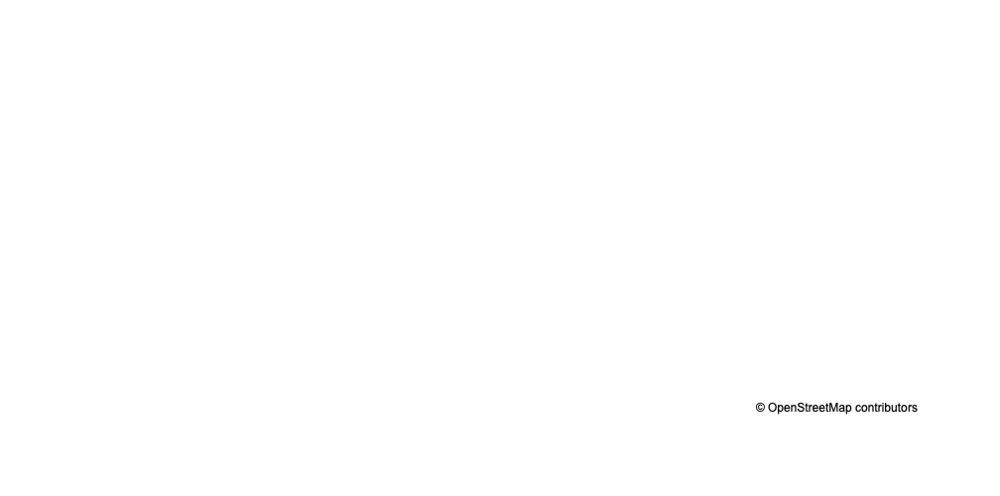

In [6]:
fig = px.scatter_mapbox(
    wonderland, 
    lat="latitude", 
    lon="longitude",
#     hover_name="placename",
    hover_data={
        "latitude": ":",
        "longitude": ":",
        "time": ":, "
    },
    zoom=11, 
    height=500,
)

# fig = px.scatter_mapbox()
# fig.update_layout(
#     margin=dict(r=0, t=0, l=0, b=0),
#     mapbox_style="white-bg",
# #     mapbox_layers=[
# #         {
# #             "below": 'traces',
# #             "sourcetype": "raster",
# #             "sourceattribution": "United States Geological Survey",
# #             "source": [
# #                 "https://basemap.nationalmap.gov/arcgis/rest/services/USGSImageryOnly/MapServer/tile/{z}/{y}/{x}"
# #             ]
# #         }
# #       ]\
# )
fig.update_layout(mapbox_style="open-street-map")

# fig.update_traces(hovertemplate='<b>%{hovertext}</b><br><br>(%{customdata[0]:.2f}, %{customdata[1]:.2f})<br>Elev. %{customdata[2]:} .ft<extra></extra>')

fig.show()